In [1]:
%matplotlib inline


from keras.models import Model
from keras import backend as K
from keras.callbacks import TensorBoard, EarlyStopping
from keras.layers import LSTM, Dropout, Dense, BatchNormalization, Activation, Input, TimeDistributed
from keras.regularizers import l2
from keras.layers.advanced_activations import LeakyReLU, ELU, PReLU
from keras.optimizers import RMSprop, Adam, Adadelta, Adagrad
from lkeras.utils import to_categorical
import numpy as np
from time import time
from matplotlib import pyplot as plt

from assignment.helpers import datapreparation as prep



fs1_dirpath = "./assignment/datasets/training/piano_roll_fs1"
fs5_dirpath = "./assignment/datasets/training/piano_roll_fs5"


# Load initial data
datasets = prep.load_all_dataset(fs5_dirpath)
dataset_names = prep.load_all_dataset_names(fs5_dirpath)
unique_names = set()
for name in dataset_names: # Make sure the same names get the same encoding each run
    unique_names.add(name)
unique_names = list(unique_names)
name_to_int = dict([(unique_names[i], i) for i in range(len(unique_names))])
int_to_name = dict([(i, unique_names[i]) for i in range(len(unique_names))])
dataset_names = to_categorical([name_to_int[name] for name in dataset_names]) # one-hot encode the composers
datasets = [dataset[:, 1:] for dataset in datasets] # Remove the headers

# Setting initial parameters
dataset_id_names = dict(zip(np.arange(len(dataset_names)), dataset_names))
longest_song = max(datasets[i].shape[1] for i in range(len(datasets)))
sequence_length = 50
length = longest_song//sequence_length + 1
num_keys = len(datasets[0])
parts_per_song = int(longest_song/sequence_length)
composer_encoding_len=len(dataset_names[0]) # 4 composers

# Makes several datasets from this first one with differing intervals between to capture the "gaps" between two sequences
# Add each subsequence of each song with differing offsets ([0:10], [1:11], [2:12], ...) to retain information.
# Unable to implement stateful, so try to retain as much information between subsequences as possible. 
# Also a way of dataset augmentation (regularization) by increasing the size of the dataset

def transpose_and_label_more(dataset_names, datasets, num_keys):
    zs = []
    datasets_transposed = np.array([(datasets[i].T, dataset_names[i]) for i in range(len(datasets))])
    for song, composer in datasets_transposed:
        for offset in range(0, sequence_length, 10): # Consider dropping offset, and use stateful to retain this info!
            for i in range(0, len(song)//sequence_length-offset):
                x = song[offset+i*sequence_length:offset+(i+1)*sequence_length]
                if i == len(song)//sequence_length - 1: # Add the EOF marker if last seq of song
                    y = np.append(song[offset+i*sequence_length+1:offset+(i+1)*sequence_length], np.array([np.ones(num_keys)]), 0)
                else:
                    y = song[offset+i*sequence_length+1:offset+(i+1)*sequence_length+1]
                zs.append((x, y, composer))
    xs, ys, composers = [], [], []
    for x, y, composer in zs:
        xs.append(x)
        ys.append(y)
        composers.append(composer)
    return np.array(xs), np.array(ys), np.array(composers)

train_xs, train_ys, train_composers = transpose_and_label_more(dataset_names, datasets, num_keys)
print(train_ys.shape)

Using TensorFlow backend.


(3342, 50, 128)


In [2]:
specialist_input = Input(shape=(composer_encoding_len,))
x = Dense(64, activation="relu")(specialist_input) # Change the activation function within as the sigmoid quickly saturates due to shape. It's ok as output though.
x = Dropout(0.5)(x)
specialist_output_c = Dense(num_keys, activation="relu")(x)
specialist_output_h = Dense(num_keys, activation="relu")(x)
#zero_input = Dropout(1)(specialist_output) # Hax to privde 0 as initial h.

inputs = Input(shape=(sequence_length, num_keys))

# Units = units per timestep LSTM block, i.e. output dimensionality (128 here since input and output 128 keys)
lstm1 = LSTM(num_keys,
               activation='relu',
               return_sequences=True,
               name="lstm1")
lstm1_outputs = lstm1(inputs, initial_state=[specialist_output_h, specialist_output_c]) # [h = prev output, c = memory], h should be None
normalized1 = BatchNormalization()(lstm1_outputs)
dense1 = Dense(num_keys, activation="sigmoid")(normalized1)

lstm2 = LSTM(num_keys,
               activation='relu',
               return_sequences=True)(dense1)
normalized2 = BatchNormalization()(lstm2)
dense2 = Dense(num_keys, activation="sigmoid")(normalized2)

outputs = TimeDistributed(Dense(num_keys, activation="sigmoid"))(normalized2) # Sigmoid keeps the probabilities independent of each other, while softmax does not!

model = Model([inputs, specialist_input], outputs)

adam = Adam(lr=0.001, amsgrad=True) 
# Ends up in a point where gradients really small, denominator really small and then loss exploding
# v_t is based on the gradients at the current time step, and previous v_t, thus when gradient really small as well as v_t-1
# the update denominator (sqrt(v_t) + epsilon) is so small that explodes.
# AMSGrad maintains the maximum of all v_t until the present time step and uses this maximum value for normalizing
# the running average of the gradient instead of the current v_t as is done in regular Adam.

#model.save("./models/latest.h5f")

In [3]:
# Want to penalize each output node independantly. 
# Log Loss aka multi-class multi-label as sigmoid -> binary CE, as want probs to be considered independent of each other.
# Combo of sigmoid and crossentropy here log counteracts exp to reduce the saturation :)
model.compile(loss='binary_crossentropy',
              optimizer=adam, # consider changing this one for others
              metrics=['categorical_accuracy'])
print(model.summary())

tensorboard = TensorBoard(log_dir="./logs/{}".format(time()))
early_stop = EarlyStopping(monitor="val_loss", min_delta=0, patience=3, verbose=0, mode="auto")

print(train_xs.shape, train_composers.shape, train_ys.shape)
model.fit([train_xs, train_composers], train_ys,
          epochs=300, # Train harder more for more things was too bad train man :(
          batch_size=32,
          shuffle=True, # shuffle here but not when constructing set to be able to validate later on :)
          callbacks=[tensorboard],
          )

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 4)            0                                            
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 64)           320         input_1[0][0]                    
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 64)           0           dense_1[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 50, 128)      0                                            
__________________________________________________________________________________________________
dense_3 (D

3342/3342 [==============================] - 22s 7ms/step - loss: 0.0403 - categorical_accuracy: 0.2358
Epoch 30/300
3342/3342 [==============================] - 26s 8ms/step - loss: 0.0401 - categorical_accuracy: 0.2374 9s - loss: 0 - ETA: 4s - loss: 0.0
Epoch 31/300
3342/3342 [==============================] - 23s 7ms/step - loss: 0.0398 - categorical_accuracy: 0.2392A: 18s - loss: 0.0
Epoch 32/300
3342/3342 [==============================] - 25s 7ms/step - loss: 0.0395 - categorical_accuracy: 0.2406A: 12s - loss: 0.0392
Epoch 33/300
3342/3342 [==============================] - 22s 7ms/step - loss: 0.0392 - categorical_accuracy: 0.2429
Epoch 34/300
3342/3342 [==============================] - 24s 7ms/step - loss: 0.0391 - categorical_accuracy: 0.2443
Epoch 35/300
3342/3342 [==============================] - 22s 6ms/step - loss: 0.0388 - categorical_accuracy: 0.2452
Epoch 36/300
3342/3342 [==============================] - 25s 7ms/step - loss: 0.0386 - categorical_accuracy: 0.2462A: 1

3342/3342 [==============================] - 20s 6ms/step - loss: 0.0312 - categorical_accuracy: 0.2939
Epoch 87/300
3342/3342 [==============================] - 27s 8ms/step - loss: 0.0311 - categorical_accuracy: 0.2939 0s - loss: 0.0311 - categorical_accuracy: 
Epoch 88/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0311 - categorical_accuracy: 0.2932A: 17s - lo - ETA: 4s
Epoch 89/300
3342/3342 [==============================] - 27s 8ms/step - loss: 0.0310 - categorical_accuracy: 0.2957 1s - loss: 0.0309 - categorical_accu
Epoch 90/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0307 - categorical_accuracy: 0.2965A: 17s - loss: 0.0309 - categorical_ac - ETA: 14s - ETA: 7s - loss: 0.0304 - ca
Epoch 91/300
3342/3342 [==============================] - 26s 8ms/step - loss: 0.0307 - categorical_accuracy: 0.2955
Epoch 92/300
3342/3342 [==============================] - 23s 7ms/step - loss: 0.0305 - categorical_accuracy: 0.2980
Epoch 93/300
3

3342/3342 [==============================] - 22s 7ms/step - loss: 0.0274 - categorical_accuracy: 0.3169A: 17s - loss: 0.0266 - categorical_accuracy - ETA:
Epoch 140/300
3342/3342 [==============================] - 23s 7ms/step - loss: 0.0272 - categorical_accuracy: 0.3174A: 18s - loss: 0.0269 -
Epoch 141/300
3342/3342 [==============================] - 23s 7ms/step - loss: 0.0271 - categorical_accuracy: 0.3195A: 
Epoch 142/300
3342/3342 [==============================] - 22s 6ms/step - loss: 0.0270 - categorical_accuracy: 0.3194 8s - loss: 0.026
Epoch 143/300
3342/3342 [==============================] - 25s 7ms/step - loss: 0.0271 - categorical_accuracy: 0.3211A: 1 - ETA: 3s - loss: 0.027
Epoch 144/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0271 - categorical_accuracy: 0.3194
Epoch 145/300
3342/3342 [==============================] - 25s 7ms/step - loss: 0.0269 - categorical_accuracy: 0.3209 1s - loss: 0.0270 - categorical_accuracy:  - ETA: 0s - loss: 0.027

3342/3342 [==============================] - 21s 6ms/step - loss: 0.0247 - categorical_accuracy: 0.3347A: 15s - loss: 0.0239 - categorical
Epoch 196/300
3342/3342 [==============================] - 27s 8ms/step - loss: 0.0246 - categorical_accuracy: 0.3348
Epoch 197/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0246 - categorical_accuracy: 0.3345 5s - loss: 0.0246 -  - ETA: 3s - loss: 0.0248 - categorical_accuracy:  - ETA: 2s - loss: 0.0247 - categorical_accuracy - ETA: 1s - loss: 0.0247 - categori
Epoch 198/300
3342/3342 [==============================] - 27s 8ms/step - loss: 0.0245 - categorical_accuracy: 0.3358
Epoch 199/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0245 - categorical_accuracy: 0.3360
Epoch 200/300
3342/3342 [==============================] - 27s 8ms/step - loss: 0.0244 - categorical_accuracy: 0.3343
Epoch 201/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0242 - categorical_accuracy: 0.336

3342/3342 [==============================] - 24s 7ms/step - loss: 0.0234 - categorical_accuracy: 0.3431A: 17s - loss: 0.0233 - cat
Epoch 243/300
3342/3342 [==============================] - 22s 7ms/step - loss: 0.0230 - categorical_accuracy: 0.3438 4s - loss: 0.0229 - categorical_ - ETA: 3s - loss: 0.0230 
Epoch 244/300
3342/3342 [==============================] - 26s 8ms/step - loss: 0.0231 - categorical_accuracy: 0.3428
Epoch 245/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0229 - categorical_accuracy: 0.3455 8s - loss: 0.0226 - categorical_accura - ETA: 7s - loss: 0 - ETA: 3s - loss: 0
Epoch 246/300
3342/3342 [==============================] - 27s 8ms/step - loss: 0.0229 - categorical_accuracy: 0.3443 0s - loss: 0.0230 - categorical_accuracy: 
Epoch 247/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0228 - categorical_accuracy: 0.3444A: 19s - loss: - ETA: 5s - loss: 0.0226 - categorical_ - ETA: 3s - los
Epoch 248/300
3342/3342 [===

3342/3342 [==============================] - 25s 8ms/step - loss: 0.0219 - categorical_accuracy: 0.3504A: 18s - loss: 0.0225 - categorical_accuracy: - ETA: 17s - loss: 0.0224 - categ
Epoch 290/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0222 - categorical_accuracy: 0.3484A: 19s - loss: 0.0226 - categorica - ETA: 16s - loss: 0.0220 - catego - ETA: 11s - loss: 0.0223 - categorical_accuracy:  - ETA: 10s - loss: 0.0222 - categorical_accurac - ETA: 3s - los
Epoch 291/300
3342/3342 [==============================] - 22s 7ms/step - loss: 0.0219 - categorical_accuracy: 0.3514A: 19s - loss: 0.0211 - categorical_ac - ETA: 16s - loss: 0.0213 - categorical_accuracy: 0.35 - ETA: 16s - loss: 0.0213 - categorical_accu - ETA: 13s - loss: 0.0220 - categorical_accuracy: 0.3 - ETA: 13s - loss: 0.0220 - c - ETA: 8s - loss: 0.0220 - categorical_accuracy: 0. - E - ETA: 3s - loss: 0
Epoch 292/300
3342/3342 [==============================] - 23s 7ms/step - loss: 0.0217 - categorica

3342/3342 [==============================] - 10s 3ms/step


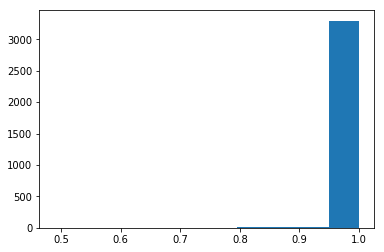

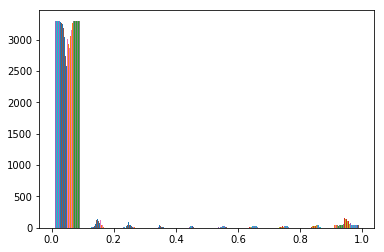

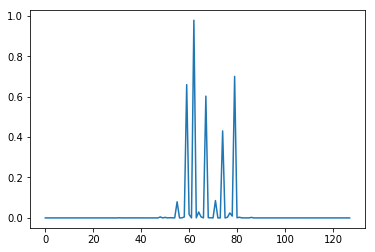

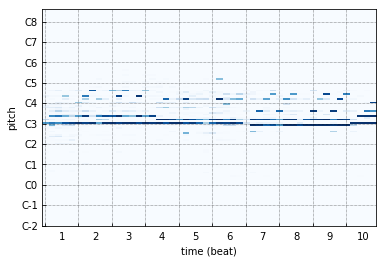

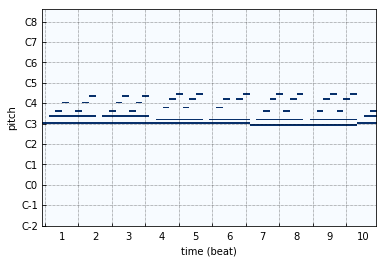

...

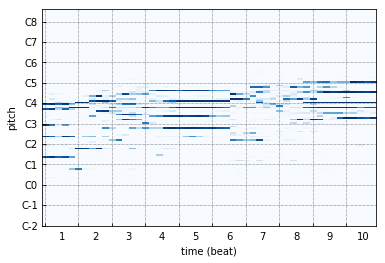

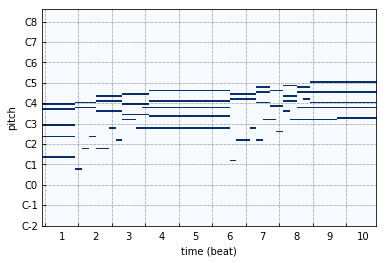

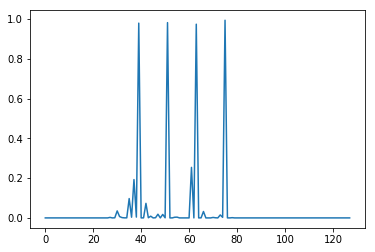

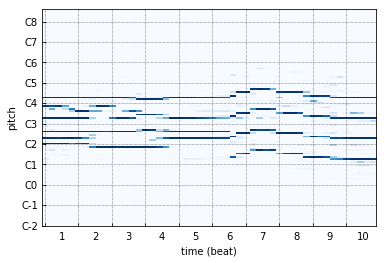

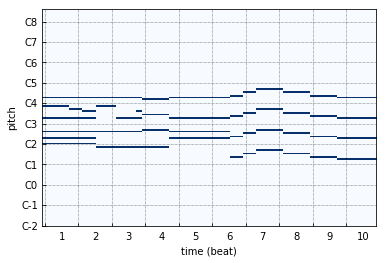

In [4]:
a = model.predict([train_xs, train_composers], verbose=True)
maxes = [np.max(c) for c in a]
plt.hist(maxes)
plt.show()
plt.hist(a[:,-1])
plt.show()
b = np.max(a[1][-1])
plt.plot(a[1][-1])
plt.show()
prep.visualize_piano_roll(a[0].T, fs=5)
prep.visualize_piano_roll(train_xs[0].T, fs=5)
plt.plot(a[100][-1])
plt.show()
prep.visualize_piano_roll(a[100].T, fs=5)
prep.visualize_piano_roll(train_xs[100].T, fs=5)
plt.plot(a[200][-1])
plt.show()
prep.visualize_piano_roll(a[200].T, fs=5)
prep.visualize_piano_roll(train_xs[200].T, fs=5)

In [14]:
from keras.models import load_model
# Restore the model and construct the encoder and decoder.
model = load_model("./models/nostate_10_offset_1_specialist.h5f")

In [15]:
model.fit([train_xs, train_composers], train_ys,
          epochs=300, # Train harder more for more things was too bad train man :(
          batch_size=32,
          shuffle=True, # shuffle here but not when constructing set to be able to validate later on :)
          callbacks=[tensorboard],
          )

Epoch 1/300
3342/3342 [==============================] - 22s 7ms/step - loss: 0.0174 - categorical_accuracy: 0.3754
Epoch 2/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0176 - categorical_accuracy: 0.3740
Epoch 3/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0176 - categorical_accuracy: 0.3733A: 16s - loss: 0.0165 - categorical_accuracy: 0. - ETA:  - ETA: 2s - loss: 0.0177 - ca
Epoch 4/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0177 - categorical_accuracy: 0.3756 3s - los
Epoch 5/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0175 - categorical_accuracy: 0.3766: 7s - loss: 0.0173 - categori
Epoch 6/300
3342/3342 [==============================] - ETA: 0s - loss: 0.0173 - categorical_accuracy: 0.3750 ETA: 1s - loss: 0.0173 - categorical_ac - 21s 6ms/step - loss: 0.0173 - categorical_accuracy: 0.3754
Epoch 7/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.017

3342/3342 [==============================] - 25s 7ms/step - loss: 0.0167 - categorical_accuracy: 0.3772
Epoch 57/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0168 - categorical_accuracy: 0.3775
Epoch 58/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0169 - categorical_accuracy: 0.3762
Epoch 59/300
3342/3342 [==============================] - 22s 6ms/step - loss: 0.0168 - categorical_accuracy: 0.3772
Epoch 60/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0168 - categorical_accuracy: 0.3770
Epoch 61/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0167 - categorical_accuracy: 0.3778
Epoch 62/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0170 - categorical_accuracy: 0.3752 2s - loss: 0.0169 - 
Epoch 63/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0171 - categorical_accuracy: 0.3759 - E - ETA: 1s - loss: 0.0172 - categorica
Epoch 64/300
3

3342/3342 [==============================] - 21s 6ms/step - loss: 0.0164 - categorical_accuracy: 0.3790A: 11s - loss: 0.0159 - categorical_accuracy:  - ETA: 10s - loss: 0.0159 - categorical_accura - ETA: 3s - los
Epoch 109/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0164 - categorical_accuracy: 0.3783A: 19s - loss:
Epoch 110/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0165 - categorical_accuracy: 0.3795
Epoch 111/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0163 - categorical_accuracy: 0.3795
Epoch 112/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0164 - categorical_accuracy: 0.3796A: 13s - loss: 0.0166 - categorical_accu - ETA: 11s - loss: 0.0165 - categorical_ac - ETA: 9s - los
Epoch 113/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0163 - categorical_accuracy: 0.3789A: 17s - loss: 0.0161 - categ - ETA: 0s - loss: 0.0163 - categorical_accuracy: 0.37
E

3342/3342 [==============================] - 25s 7ms/step - loss: 0.0162 - categorical_accuracy: 0.3825
Epoch 163/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0162 - categorical_accuracy: 0.3791A: 16s - loss: 0.0154 - categ
Epoch 164/300
3342/3342 [==============================] - 24s 7ms/step - loss: 0.0161 - categorical_accuracy: 0.3829
Epoch 165/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0161 - categorical_accuracy: 0.3799A: 15s - loss: 0.0160 - categorical_a - ETA: 12s - loss: 0.0160 - categorical_accura - ETA:
Epoch 166/300
3342/3342 [==============================] - 22s 7ms/step - loss: 0.0161 - categorical_accuracy: 0.3800
Epoch 167/300
3342/3342 [==============================] - 23s 7ms/step - loss: 0.0161 - categorical_accuracy: 0.3820 5s - loss: 0.0161 - categorical_ - ETA: 3s - loss: 0.0161 
Epoch 168/300
3342/3342 [==============================] - 25s 8ms/step - loss: 0.0161 - categorical_accuracy: 0.3806
Epoch 169

3342/3342 [==============================] - 27s 8ms/step - loss: 0.0159 - categorical_accuracy: 0.3823 5s - los
Epoch 220/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0160 - categorical_accuracy: 0.3827 3s - loss: 0.016
Epoch 221/300
3342/3342 [==============================] - 25s 8ms/step - loss: 0.0158 - categorical_accuracy: 0.3828 3s - loss: 0.0159 - ca
Epoch 222/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0157 - categorical_accuracy: 0.3813A: 19s - loss: 0.0160 - categorical_accura - ETA: 17s - loss: 0. - ETA:  - ETA: 0s - loss: 0.0156 - categorical_accuracy: 0.38
Epoch 223/300
3342/3342 [==============================] - 26s 8ms/step - loss: 0.0158 - categorical_accuracy: 0.3820
Epoch 224/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0158 - categorical_accuracy: 0.3824 3s - loss: 0 - ETA: 0s - loss: 0.0157 - categorical_accuracy: 0.38
Epoch 225/300
3342/3342 [==============================] - 27s 8

3342/3342 [==============================] - 25s 8ms/step - loss: 0.0157 - categorical_accuracy: 0.3825A: 
Epoch 273/300
3342/3342 [==============================] - 23s 7ms/step - loss: 0.0156 - categorical_accuracy: 0.3839
Epoch 274/300
3342/3342 [==============================] - 27s 8ms/step - loss: 0.0190 - categorical_accuracy: 0.3685
Epoch 275/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0165 - categorical_accuracy: 0.3809
Epoch 276/300
3342/3342 [==============================] - 27s 8ms/step - loss: 0.0167 - categorical_accuracy: 0.3783
Epoch 277/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0169 - categorical_accuracy: 0.3795A: 16s - loss: 0.0164 - categ - E
Epoch 278/300
3342/3342 [==============================] - 27s 8ms/step - loss: 0.0191 - categorical_accuracy: 0.3725 3s - loss: 0.0191 - cate
Epoch 279/300
3342/3342 [==============================] - 21s 6ms/step - loss: 0.0168 - categorical_accuracy: 0.3801A: 13s - l

In [18]:
model.save("./models/nostate_50_offset_10_specialist.h5f")

c:\users\hanak\venv\music\lib\site-packages\keras\engine\network.py:877: UserWarning: Layer lstm1 was passed non-serializable keyword arguments: {'initial_state': [<tf.Tensor 'dense_3_2/Relu:0' shape=(?, 128) dtype=float32>, <tf.Tensor 'dense_2_2/Relu:0' shape=(?, 128) dtype=float32>]}. They will not be included in the serialized model (and thus will be missing at deserialization time).
  '. They will not be included '


3342/3342 [==============================] - 10s 3ms/step


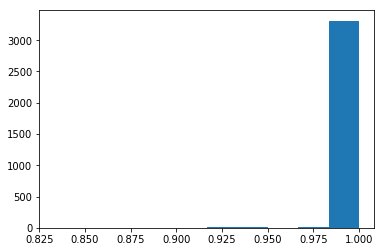

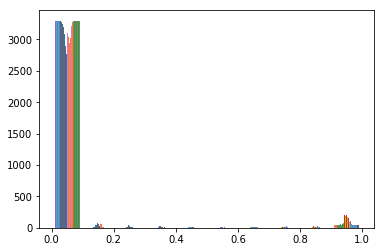

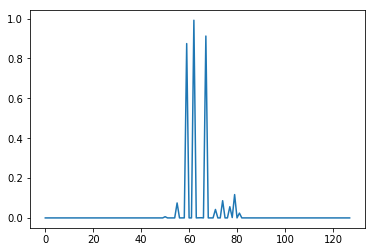

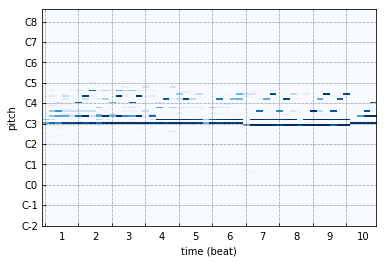

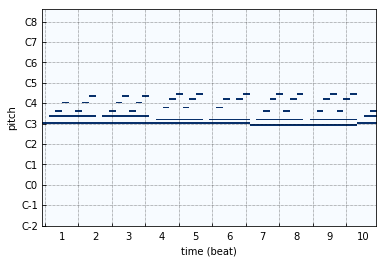

...

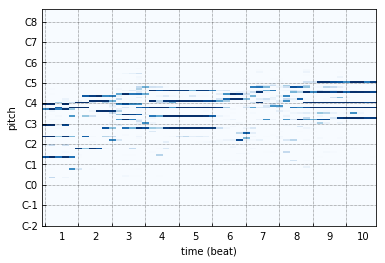

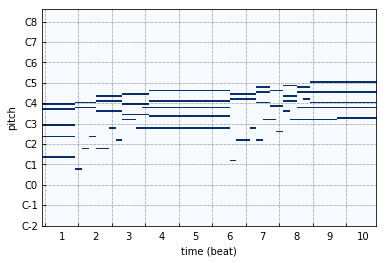

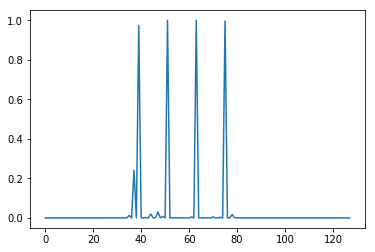

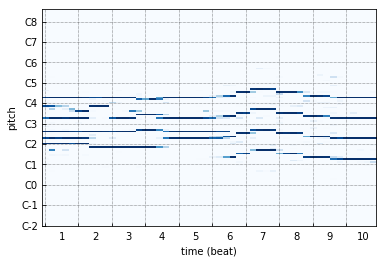

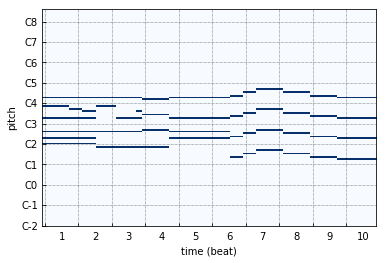

In [19]:
a = model.predict([train_xs, train_composers], verbose=True)
maxes = [np.max(c) for c in a]
plt.hist(maxes)
plt.show()
plt.hist(a[:,-1])
plt.show()
b = np.max(a[1][-1])
plt.plot(a[1][-1])
plt.show()
prep.visualize_piano_roll(a[0].T, fs=5)
prep.visualize_piano_roll(train_xs[0].T, fs=5)
plt.plot(a[100][-1])
plt.show()
prep.visualize_piano_roll(a[100].T, fs=5)
prep.visualize_piano_roll(train_xs[100].T, fs=5)
plt.plot(a[200][-1])
plt.show()
prep.visualize_piano_roll(a[200].T, fs=5)
prep.visualize_piano_roll(train_xs[200].T, fs=5)

In [20]:
def make_song_from_predict(model, initial_data, composer, limit):
    song = []
    keep_producing = True
    prev_data = initial_data
    while keep_producing and len(song) < limit:
        predictions = model.predict([np.array([prev_data]), composer])[0]
        labels = np.zeros(predictions.shape)
        labels[predictions>0.4] = 1 # Threshold to consider the key as active, binarized based on this
        last_output = labels[-1]
        keep_producing = np.sum(last_output) != len(last_output)
        song.append(last_output)
        prev_data = np.append(prev_data[1:], [last_output], 0)
    return np.array(song)

initial_step = 250
steps = 10
song1 = make_song_from_predict(model, train_xs[initial_step], np.array([[1.0, 0.0, 0.0, 0.0]]), sequence_length*steps)
song2 = make_song_from_predict(model, train_xs[initial_step], np.array([[0.0, 1.0, 0.0, 0.0]]), sequence_length*steps)
song3 = make_song_from_predict(model, train_xs[initial_step], np.array([[0.0, 0.0, 1.0, 0.0]]), sequence_length*steps)
song4 = make_song_from_predict(model, train_xs[initial_step], np.array([[0.0, 0.0, 0.0, 1.0]]), sequence_length*steps)
prep.embed_play_v1(song1.T, fs=5)


In [21]:
prep.embed_play_v1(song2.T, fs=5)

In [22]:
prep.embed_play_v1(song3.T, fs=5)

In [23]:
prep.embed_play_v1(song4.T, fs=5)

[1. 0. 0. 0.]
brahms


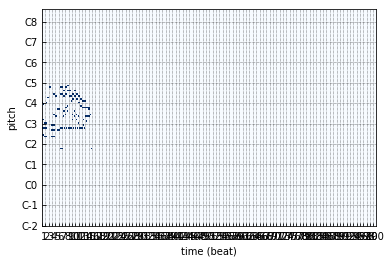

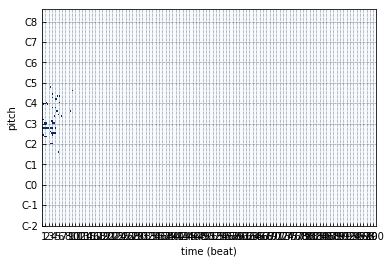

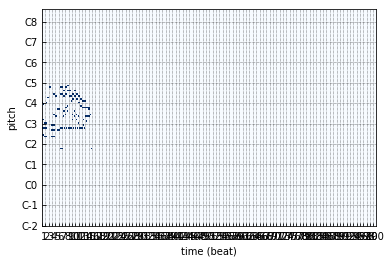

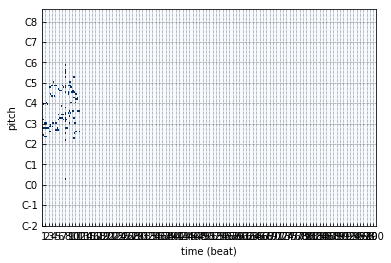

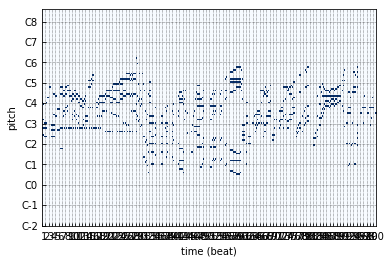

In [24]:
actual = train_xs[initial_step+1]
print(train_composers[initial_step])
print(int_to_name[list(train_composers[initial_step]).index(1)])
for i in range(1, steps):
    actual = np.append(actual, train_xs[initial_step+1+i], axis=0)
actual = actual.T
prep.visualize_piano_roll(song1.T, fs=5)
prep.visualize_piano_roll(song2.T, fs=5)
prep.visualize_piano_roll(song3.T, fs=5)
prep.visualize_piano_roll(song4.T, fs=5)
prep.visualize_piano_roll(actual, fs=5)
prep.embed_play_v1(actual, fs=5)

In [25]:
from keras.models import load_model
# Restore the model and construct the encoder and decoder.
model = load_model("./models/nostate_50_offset_10_specialist.h5f")
for layer in model.layers:
    print(layer)
print(model.summary())
a = model.evaluate([train_xs, train_composers], train_ys,
          batch_size=32)
print(a)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 4)            0                                            
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 64)           320         input_1[0][0]                    
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 64)           0           dense_1[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 50, 128)      0                                            
__________________________________________________________________________________________________
dense_3 (D